$$
\newcommand{\mat}[1]{\boldsymbol {#1}}
\newcommand{\mattr}[1]{\boldsymbol {#1}^\top}
\newcommand{\matinv}[1]{\boldsymbol {#1}^{-1}}
\newcommand{\vec}[1]{\boldsymbol {#1}}
\newcommand{\vectr}[1]{\boldsymbol {#1}^\top}
\newcommand{\rvar}[1]{\mathrm {#1}}
\newcommand{\rvec}[1]{\boldsymbol{\mathrm{#1}}}
\newcommand{\diag}{\mathop{\mathrm {diag}}}
\newcommand{\set}[1]{\mathbb {#1}}
\newcommand{\norm}[1]{\left\lVert#1\right\rVert}
\newcommand{\pderiv}[2]{\frac{\partial #1}{\partial #2}}
\newcommand{\bm}[1]{{\bf #1}}
\newcommand{\bb}[1]{\bm{\mathrm{#1}}}
$$

# Part 2: Generative Adversarial Networks
<a id=part3></a>

In this part we will implement and train a generative adversarial network and apply it to the task of image generation.

In [1]:
import unittest
import os
import sys
import pathlib
import urllib
import shutil
import re
import zipfile

import numpy as np
import torch
import matplotlib.pyplot as plt

%load_ext autoreload
%autoreload 2

test = unittest.TestCase()
plt.rcParams.update({'font.size': 12})
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Using device:', device)

Using device: cuda


### Obtaining the dataset
<a id=part3_1></a>

Let's begin by downloading a dataset of images that we want to learn to generate. 
We'll use the [Labeled Faces in the Wild](http://vis-www.cs.umass.edu/lfw/) (LFW) dataset which contains many labeled faces of famous individuals.

We're going to train our generative model to generate a specific face, not just any face.
Since the person with the most images in this dataset is former president George W. Bush, we'll set out to train a Bush Generator :)

However, if you feel adventurous and/or prefer to generate something else, feel free to edit the `PART2_CUSTOM_DATA_URL` variable in `hw3/answers.py`.


You can use a custom dataset, by editing the `PART3_CUSTOM_DATA_URL` variable in `hw3/answers.py`, and get a bonus!

In [2]:
import cs236781.plot as plot
import cs236781.download
from hw3.answers import PART3_CUSTOM_DATA_URL as CUSTOM_DATA_URL

DATA_DIR = pathlib.Path.home().joinpath('.pytorch-datasets')
if CUSTOM_DATA_URL is None:
    DATA_URL = 'http://vis-www.cs.umass.edu/lfw/lfw-bush.zip'
else:
    DATA_URL = CUSTOM_DATA_URL

_, dataset_dir = cs236781.download.download_data(out_path=DATA_DIR, url=DATA_URL, extract=True, force=False)

File C:\Users\kingh\.pytorch-datasets\George_W_Bush2.zip exists, skipping download.
Extracting C:\Users\kingh\.pytorch-datasets\George_W_Bush2.zip...
Extracted 532 to C:\Users\kingh\.pytorch-datasets\George_W_Bush/George_W_Bush


Create a `Dataset` object that will load the extraced images:

In [3]:
import torchvision.transforms as T
from torchvision.datasets import ImageFolder

im_size = 64
tf = T.Compose([
    # Resize to constant spatial dimensions
    T.Resize((im_size, im_size)),
    # PIL.Image -> torch.Tensor
    T.ToTensor(),
    # Dynamic range [0,1] -> [-1, 1]
    T.Normalize(mean=(.5,.5,.5), std=(.5,.5,.5)),
])

ds_gwb = ImageFolder(os.path.dirname(dataset_dir), tf)

OK, let's see what we got. You can run the following block multiple times to display a random subset of images from the dataset.

Found 530 images in dataset folder.


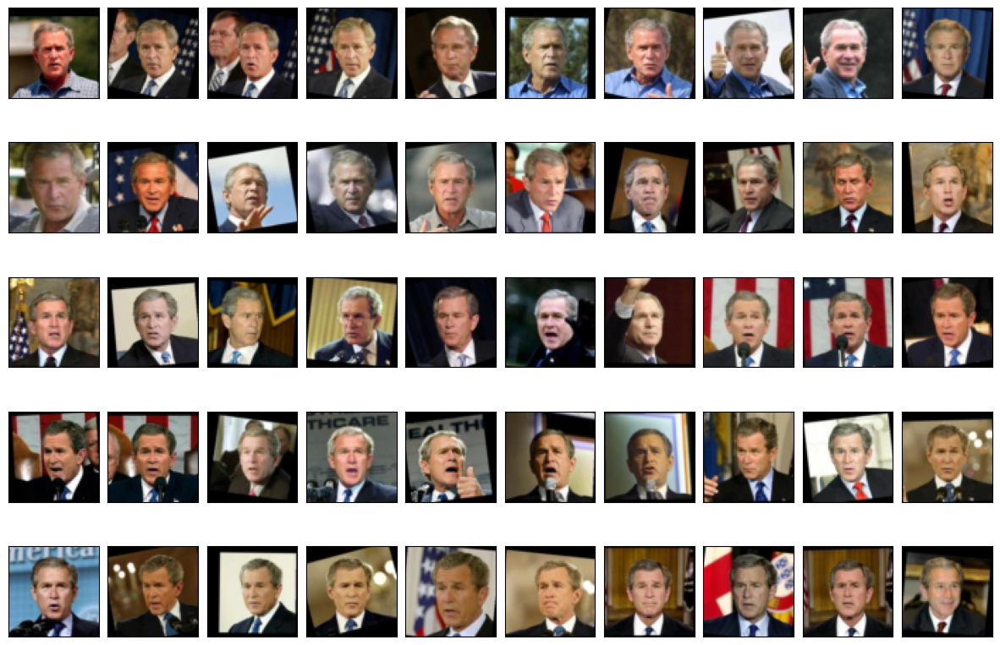

In [4]:
_ = plot.dataset_first_n(ds_gwb, 50, figsize=(15,10), nrows=5)
print(f'Found {len(ds_gwb)} images in dataset folder.')

In [5]:
x0, y0 = ds_gwb[0]
x0 = x0.unsqueeze(0).to(device)
print(x0.shape)

test.assertSequenceEqual(x0.shape, (1, 3, im_size, im_size))

torch.Size([1, 3, 64, 64])


## Generative Adversarial Nets (GANs)
<a id=part3_2></a>

GANs, first proposed in a [paper](https://arxiv.org/pdf/1406.2661.pdf) by Ian Goodfellow in 2014 are today arguably the most popular type of generative model. GANs are currently producing state of the art
results in generative tasks over many different domains.

In a GAN model, two different neural networks compete against each other: A **generator** and a **discriminator**.

- The Generator, which we'll denote as $\Psi _{\bb{\gamma}} : \mathcal{U} \rightarrow \mathcal{X}$, maps a latent-space variable
$\bb{u}\sim\mathcal{N}(\bb{0},\bb{I})$ to an instance-space variable $\bb{x}$ (e.g. an image).
Thus a parametric evidence distribution $p_{\bb{\gamma}}(\bb{X})$ is generated,
which we typically would like to be as close as possible to the real evidence distribution, $p(\bb{X})$.

- The Discriminator, $\Delta _{\bb{\delta}} : \mathcal{X} \rightarrow [0,1]$, is a network which,
given an instance-space variable $\bb{x}$, returns the  probability that $\bb{x}$ is real, i.e. that $\bb{x}$
was sampled from $p(\bb{X})$ and not $p_{\bb{\gamma}}(\bb{X})$.


<img src="imgs/gan.jpg" />

### Training GANs
<a id=part3_3></a>

The generator is trained to generate "fake" instances which will maximally fool the
discriminator into returning that they're real. Mathematically, the generator's parameters
$\bb{\gamma}$ should be chosen such as to **maximize** the expression
$$
\mathbb{E} _{\bb{z} \sim p(\bb{Z}) } \log (\Delta _{\bb{\delta}}(\Psi _{\bb{\gamma}} (\bb{z}) )).
$$

The discriminator is trained to classify between real images, coming from the training set,
and fake images generated by the generator.
Mathematically, the discriminator's parameters $\bb{\delta}$ should be chosen such as to
**maximize** the expression
$$
\mathbb{E} _{\bb{x} \sim p(\bb{X}) } \log \Delta _{\bb{\delta}}(\bb{x})  \, + \,
\mathbb{E} _{\bb{z} \sim p(\bb{Z}) } \log (1-\Delta _{\bb{\delta}}(\Psi _{\bb{\gamma}} (\bb{z}) )).
$$

These two competing objectives can thus be expressed as the following min-max optimization:
$$
\min _{\bb{\gamma}} \max _{\bb{\delta}} \,
\mathbb{E} _{\bb{x} \sim p(\bb{X}) } \log \Delta _{\bb{\delta}}(\bb{x})  \, + \,
\mathbb{E} _{\bb{z} \sim p(\bb{Z}) } \log (1-\Delta _{\bb{\delta}}(\Psi _{\bb{\gamma}} (\bb{z}) )).
$$

A key insight into GANs is that we can interpret the above maximum as the *loss* with respect to
$\bb{\gamma}$:

$$
L({\bb{\gamma}}) =
\max _{\bb{\delta}} \, \mathbb{E} _{\bb{x} \sim p(\bb{X}) } \log \Delta _{\bb{\delta}}(\bb{x})  \, + \,
  \mathbb{E} _{\bb{z} \sim p(\bb{Z}) } \log (1-\Delta _{\bb{\delta}}(\Psi _{\bb{\gamma}} (\bb{z}) )).
$$

This means that the generator's loss function trains together with the generator
itself in an adversarial manner. In contrast, when training our VAE we used a fixed L2 norm
as a data loss term.

### Model Implementation
<a id=part3_4></a>

We'll now implement a Deep Convolutional GAN (DCGAN) model.
See the DCGAN [paper](https://arxiv.org/pdf/1511.06434.pdf) for architecture ideas and tips for training.

**TODO**: Implement the `Discriminator` class in the `hw3/gan.py` module.
If you wish you can reuse the `EncoderCNN` class from the VAE model as the first part of the Discriminator.

In [34]:
import hw3.gan as gan

dsc = gan.Discriminator(in_size=x0[0].shape).to(device)
print(dsc)

d0 = dsc(x0)
print(d0.shape)

test.assertSequenceEqual(d0.shape, (1,1))

Discriminator(
  (cnn): Sequential(
    (0): Conv2d(3, 64, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.9, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.01)
    (3): Conv2d(64, 128, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2))
    (4): BatchNorm2d(128, eps=1e-05, momentum=0.9, affine=True, track_running_stats=True)
    (5): LeakyReLU(negative_slope=0.01)
    (6): Conv2d(128, 256, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2))
    (7): BatchNorm2d(256, eps=1e-05, momentum=0.9, affine=True, track_running_stats=True)
    (8): LeakyReLU(negative_slope=0.01)
  )
  (fully_connected_layer): Linear(in_features=16384, out_features=1, bias=True)
)
torch.Size([1, 1])


**TODO**: Implement the `Generator` class in the `hw3/gan.py` module.
If you wish you can reuse the `DecoderCNN` class from the VAE model as the last part of the Generator.

In [35]:
z_dim = 128
gen = gan.Generator(z_dim, 4).to(device)
print(gen)

z = torch.randn(1, z_dim).to(device)
xr = gen(z)
print(xr.shape)

test.assertSequenceEqual(x0.shape, xr.shape)

Generator(
  (fc): Linear(in_features=128, out_features=16384, bias=False)
  (generator): Sequential(
    (0): ConvTranspose2d(1024, 512, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (1): BatchNorm2d(512, eps=1e-06, momentum=0.9, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.01)
    (3): ConvTranspose2d(512, 256, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2), output_padding=(1, 1))
    (4): BatchNorm2d(256, eps=1e-06, momentum=0.9, affine=True, track_running_stats=True)
    (5): LeakyReLU(negative_slope=0.01)
    (6): ConvTranspose2d(256, 128, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2), output_padding=(1, 1))
    (7): BatchNorm2d(128, eps=1e-06, momentum=0.9, affine=True, track_running_stats=True)
    (8): LeakyReLU(negative_slope=0.01)
    (9): ConvTranspose2d(128, 64, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2), output_padding=(1, 1))
    (10): BatchNorm2d(64, eps=1e-06, momentum=0.9, affine=True, track_running_stats=True)
    (

### Loss Implementation
<a id=part3_5></a>

Let's begin with the discriminator's loss function.
Based on the above we can flip the sign and say we want to update the 
Discriminator's parameters $\bb{\delta}$ so that they **minimize** the expression
$$
- \mathbb{E} _{\bb{x} \sim p(\bb{X}) } \log \Delta _{\bb{\delta}}(\bb{x})  \, - \,
\mathbb{E} _{\bb{z} \sim p(\bb{Z}) } \log (1-\Delta _{\bb{\delta}}(\Psi _{\bb{\gamma}} (\bb{z}) )).
$$

We're using the Discriminator twice in this expression;
once to classify data from the real data distribution and
once again to classify generated data.
Therefore our loss should be computed based on these two terms.
Notice that since the discriminator returns a probability, we can formulate the above as two cross-entropy losses.

GANs are notoriously diffucult to train.
One common trick for improving GAN stability during training is to make the classification labels noisy for the discriminator. This can be seen as a form of regularization, to help prevent the discriminator from overfitting.

We'll incorporate this idea into our loss function. Instead of labels being equal to 0 or 1, we'll make them
"fuzzy", i.e. random numbers in the ranges $[0\pm\epsilon]$ and $[1\pm\epsilon]$.

**TODO**: Implement the `discriminator_loss_fn()` function in the `hw3/gan.py` module.

In [36]:
from hw3.gan import discriminator_loss_fn
torch.manual_seed(42)

y_data = torch.rand(10) * 10
y_generated = torch.rand(10) * 10

loss = discriminator_loss_fn(y_data, y_generated, data_label=1, label_noise=0.3)
print(loss)

test.assertAlmostEqual(loss.item(), 6.4808731, delta=1e-5)


tensor(6.4809)


Similarly, the generator's parameters $\bb{\gamma}$ should **minimize** the expression
$$
-\mathbb{E} _{\bb{z} \sim p(\bb{Z}) } \log (\Delta _{\bb{\delta}}(\Psi _{\bb{\gamma}} (\bb{z}) ))
$$

which can also be seen as a cross-entropy term. This corresponds to "fooling" the discriminator; Notice that the gradient of the loss w.r.t $\bb{\gamma}$ using this expression also depends on $\bb{\delta}$.

**TODO**: Implement the `generator_loss_fn()` function in the `hw3/gan.py` module.

In [37]:
from hw3.gan import generator_loss_fn
torch.manual_seed(42)

y_generated = torch.rand(20) * 10

loss = generator_loss_fn(y_generated, data_label=1)
print(loss)

test.assertAlmostEqual(loss.item(), 0.0222969, delta=1e-3)

tensor(0.0223)


### Sampling
<a id=part3_6></a>

Sampling from a GAN is straightforward, since it learns to generate data from an isotropic Gaussian latent space distribution.

There is an important nuance however. Sampling is required during the process of training the GAN, since
we generate fake images to show the discriminator.
As you'll seen in the next section,  in some cases we'll need our samples to have gradients (i.e., to be part of
the Generator's computation graph).

**TODO**: Implement the `sample()` method in the `Generator` class within the `hw3/gan.py` module.

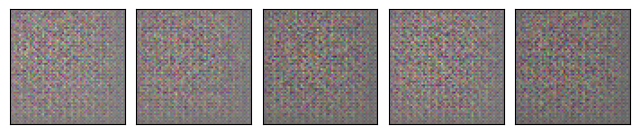

In [38]:
samples = gen.sample(5, with_grad=False)
test.assertSequenceEqual(samples.shape, (5, *x0.shape[1:]))
test.assertIsNone(samples.grad_fn)
_ = plot.tensors_as_images(samples.cpu())

samples = gen.sample(5, with_grad=True)
test.assertSequenceEqual(samples.shape, (5, *x0.shape[1:]))
test.assertIsNotNone(samples.grad_fn)

### Training
<a id=part3_7></a>

Training GANs is a bit different since we need to train two models simultaneously, each with it's own separate loss function and optimizer. We'll implement the training logic as a function that handles one batch of data
and updates both the discriminator and the generator based on it.

As mentioned above, GANs are considered hard to train. To get some ideas and tips you can see this [paper](https://arxiv.org/pdf/1606.03498.pdf), this list of ["GAN hacks"](https://github.com/soumith/ganhacks) or just do it the hard way :)

**TODO**:
1. Implement the `train_batch` function in the `hw3/gan.py` module.
2. Tweak the hyperparameters in the `part3_gan_hyperparams()` function within the `hw3/answers.py` module.

In [66]:
import torch.optim as optim
from torch.utils.data import DataLoader
from hw3.answers import part3_gan_hyperparams

torch.manual_seed(42)

# Hyperparams
hp = part3_gan_hyperparams()
batch_size = hp['batch_size']
z_dim = hp['z_dim']

# Data
dl_train = DataLoader(ds_gwb, batch_size, shuffle=True)
im_size = ds_gwb[0][0].shape

# Model
dsc = gan.Discriminator(im_size).to(device)
gen = gan.Generator(z_dim, featuremap_size=4).to(device)

# Optimizer
def create_optimizer(model_params, opt_params):
    opt_params = opt_params.copy()
    optimizer_type = opt_params['type']
    opt_params.pop('type')
    return optim.__dict__[optimizer_type](model_params, **opt_params)
dsc_optimizer = create_optimizer(dsc.parameters(), hp['discriminator_optimizer'])
gen_optimizer = create_optimizer(gen.parameters(), hp['generator_optimizer'])

# Loss
def dsc_loss_fn(y_data, y_generated):
    return gan.discriminator_loss_fn(y_data, y_generated, hp['data_label'], hp['label_noise'])

def gen_loss_fn(y_generated):
    return gan.generator_loss_fn(y_generated, hp['data_label'])

# Training
checkpoint_file = 'checkpoints/gan'
checkpoint_file_final = f'{checkpoint_file}_final'
if os.path.isfile(f'{checkpoint_file}.pt'):
    os.remove(f'{checkpoint_file}.pt')

# Show hypers
print(hp)

{'batch_size': 8, 'z_dim': 1024, 'data_label': 1, 'label_noise': 0.2, 'learn_rate': 0.0002, 'discriminator_optimizer': {'type': 'Adam', 'lr': 0.0002}, 'generator_optimizer': {'type': 'Adam', 'lr': 0.0002}}


**TODO**:
1. Implement the `save_checkpoint` function in the `hw3.gan` module. You can decide on your own criterion regarding whether to save a checkpoint at the end of each epoch.
1. Run the following block to train. It will sample some images from your model every few epochs so you can see the progress.
2. When you're satisfied with your results, rename the checkpoints file by adding `_final`. When you run the `main.py` script to generate your submission, the final checkpoints file will be loaded instead of running training. Note that your final submission zip will not include the `checkpoints/` folder. This is OK.

--- EPOCH 1/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 15.11it/s]
Discriminator loss: 0.19414730692532525
Generator loss:     5.315356695829933
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


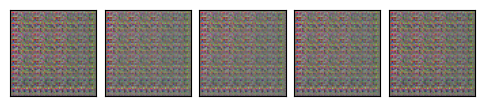

--- EPOCH 2/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 16.89it/s]
Discriminator loss: 0.07200530249236235
Generator loss:     6.897498828261646
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


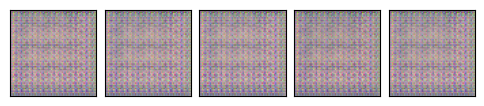

--- EPOCH 3/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 16.85it/s]
Discriminator loss: 0.07202050317801646
Generator loss:     8.091791850417408
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


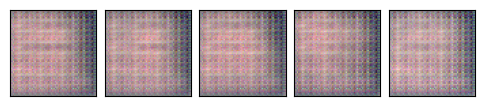

--- EPOCH 4/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 16.59it/s]
Discriminator loss: 0.1069255051161371
Generator loss:     8.05132508277893
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


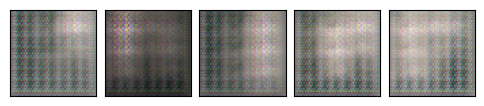

--- EPOCH 5/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 16.88it/s]
Discriminator loss: 0.1104131262026616
Generator loss:     6.941315885800035
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


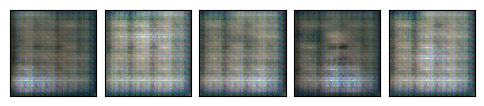

--- EPOCH 6/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 16.85it/s]
Discriminator loss: 0.10615330356270519
Generator loss:     7.247735382905647
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


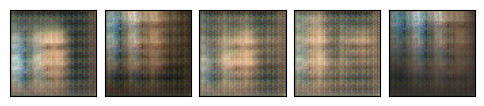

--- EPOCH 7/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 16.82it/s]
Discriminator loss: 0.11113412694922134
Generator loss:     6.975996423123488
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


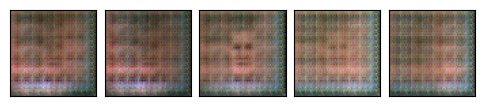

--- EPOCH 8/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 15.83it/s]
Discriminator loss: 0.15032807403980797
Generator loss:     7.634674207488103
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


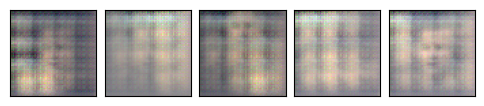

--- EPOCH 9/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 16.33it/s]
Discriminator loss: 0.15980662619556063
Generator loss:     6.601460300274749
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


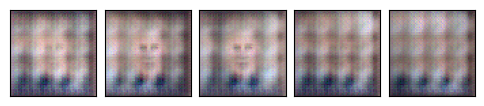

--- EPOCH 10/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 16.75it/s]
Discriminator loss: 0.18492013938836196
Generator loss:     6.900676844724968
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


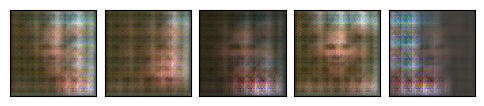

--- EPOCH 11/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 16.54it/s]
Discriminator loss: 0.14939555164370963
Generator loss:     6.983033888375581
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


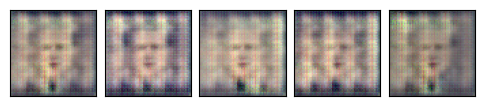

--- EPOCH 12/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 16.84it/s]
Discriminator loss: 0.15816189951972284
Generator loss:     6.719574127624284
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


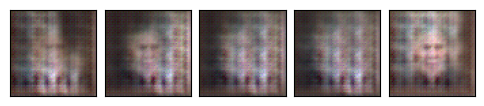

--- EPOCH 13/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 16.87it/s]
Discriminator loss: 0.13310283222305241
Generator loss:     6.366646709726818
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


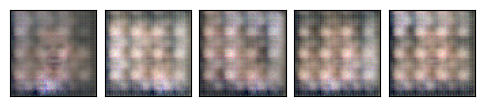

--- EPOCH 14/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 16.74it/s]
Discriminator loss: 0.07869144801550837
Generator loss:     7.302098096306644
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


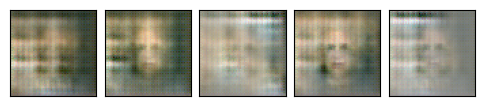

--- EPOCH 15/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 16.73it/s]
Discriminator loss: 0.1979533873720845
Generator loss:     6.722499249586418
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


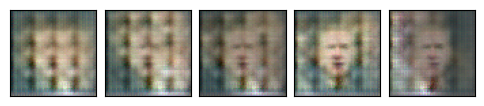

--- EPOCH 16/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 16.73it/s]
Discriminator loss: 0.21189816651949242
Generator loss:     6.692042187078675
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


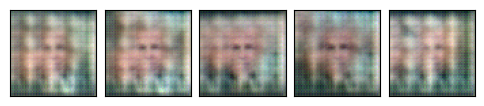

--- EPOCH 17/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 16.68it/s]
Discriminator loss: 0.08331341791286398
Generator loss:     6.458333474486621
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


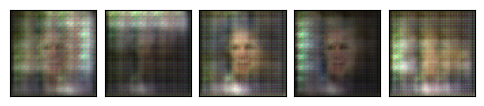

--- EPOCH 18/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 16.77it/s]
Discriminator loss: 0.0953401595965695
Generator loss:     7.338791149765698
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


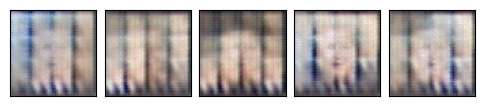

--- EPOCH 19/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 16.77it/s]
Discriminator loss: 0.08910231030921438
Generator loss:     7.304179746713212
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


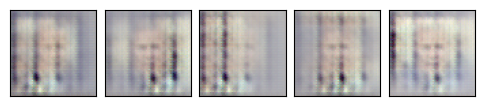

--- EPOCH 20/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 16.65it/s]
Discriminator loss: 0.08038340809185114
Generator loss:     6.978067195237572
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


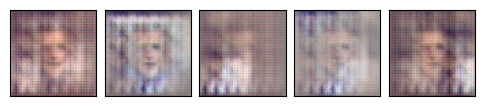

--- EPOCH 21/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 16.84it/s]
Discriminator loss: 0.16333794037797558
Generator loss:     7.342149720263126
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


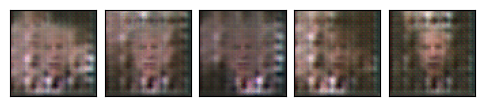

--- EPOCH 22/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 16.82it/s]
Discriminator loss: 0.1478407848904382
Generator loss:     7.806550609531687
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


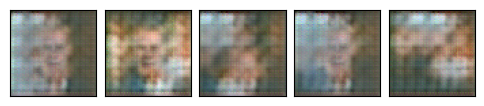

--- EPOCH 23/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 16.81it/s]
Discriminator loss: 0.14843062672819665
Generator loss:     6.81205831001054
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


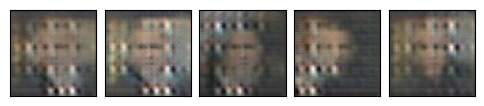

--- EPOCH 24/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 16.76it/s]
Discriminator loss: 0.19064324009996741
Generator loss:     6.83385336221154
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


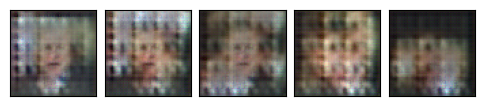

--- EPOCH 25/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 16.46it/s]
Discriminator loss: 0.2047604475337178
Generator loss:     7.327789082455991
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


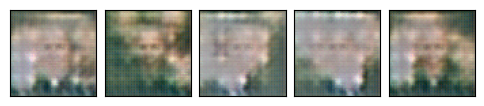

--- EPOCH 26/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 16.83it/s]
Discriminator loss: 0.13528760950734367
Generator loss:     7.351583640966842
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


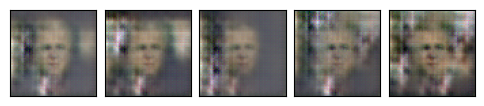

--- EPOCH 27/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 16.76it/s]
Discriminator loss: 0.12921012331967924
Generator loss:     7.193830347772854
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


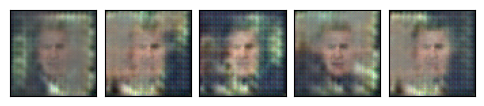

--- EPOCH 28/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 16.73it/s]
Discriminator loss: 0.12088959541783403
Generator loss:     6.487402549430506
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


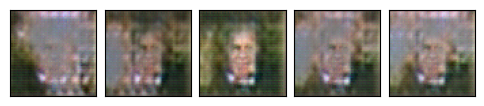

--- EPOCH 29/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 16.81it/s]
Discriminator loss: 0.18169697957919606
Generator loss:     7.767313213490728
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


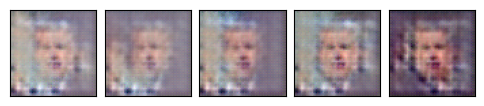

--- EPOCH 30/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 16.77it/s]
Discriminator loss: 0.10341577653064211
Generator loss:     7.323663234710693
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


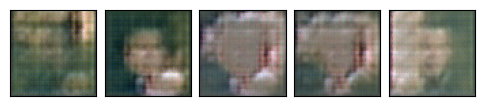

--- EPOCH 31/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 16.69it/s]
Discriminator loss: 0.23995715085027822
Generator loss:     7.776920229641359
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


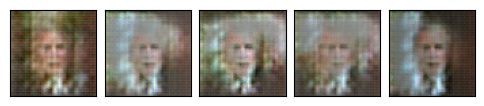

--- EPOCH 32/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 16.77it/s]
Discriminator loss: 0.08013526505943555
Generator loss:     6.254208016751417
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


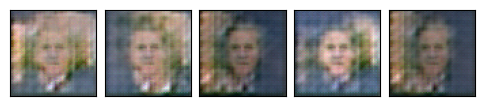

--- EPOCH 33/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 16.33it/s]
Discriminator loss: 0.16845265016960564
Generator loss:     6.632912980976389
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


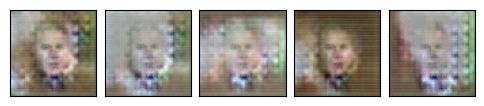

--- EPOCH 34/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 16.80it/s]
Discriminator loss: 0.10620888294791107
Generator loss:     8.663787211944808
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


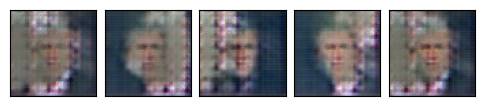

--- EPOCH 35/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 16.79it/s]
Discriminator loss: 0.13979982751518932
Generator loss:     7.141411393436034
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


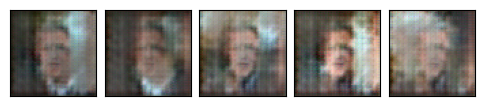

--- EPOCH 36/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 16.84it/s]
Discriminator loss: 0.10228586961417946
Generator loss:     6.71507684864215
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


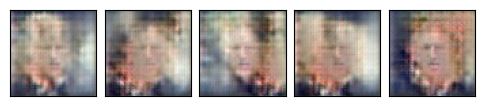

--- EPOCH 37/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 16.64it/s]
Discriminator loss: 0.10692666006733233
Generator loss:     7.2915207841503085
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


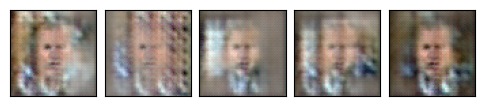

--- EPOCH 38/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 16.59it/s]
Discriminator loss: 0.1706032749376635
Generator loss:     6.8270979906196025
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


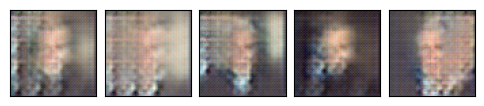

--- EPOCH 39/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 16.19it/s]
Discriminator loss: 0.12915932359312898
Generator loss:     9.545763748795238
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


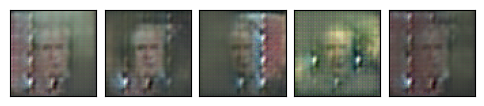

--- EPOCH 40/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 16.73it/s]
Discriminator loss: 0.13923806841693706
Generator loss:     6.818655686591988
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


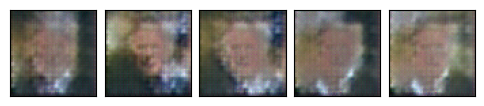

--- EPOCH 41/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 16.76it/s]
Discriminator loss: 0.1482569787706902
Generator loss:     7.203314254532999
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


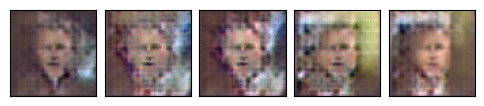

--- EPOCH 42/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 16.74it/s]
Discriminator loss: 0.16711381856185287
Generator loss:     6.226631303331745
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


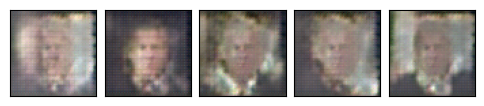

--- EPOCH 43/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 16.28it/s]
Discriminator loss: 0.12715747685574774
Generator loss:     6.328286188751904
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


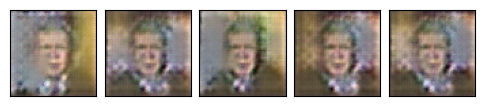

--- EPOCH 44/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 15.89it/s]
Discriminator loss: 0.132389497178704
Generator loss:     7.006009692576394
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


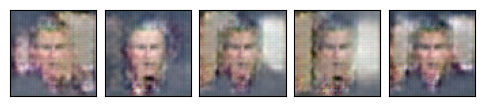

--- EPOCH 45/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 15.36it/s]
Discriminator loss: 0.18123157080540905
Generator loss:     6.958256614741995
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


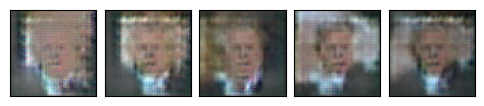

--- EPOCH 46/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 16.42it/s]
Discriminator loss: 0.12418945450613748
Generator loss:     6.377188543775189
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


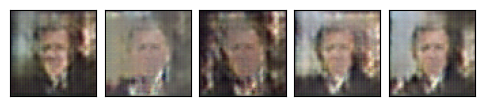

--- EPOCH 47/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 16.50it/s]
Discriminator loss: 0.1689540777744642
Generator loss:     6.314055626072101
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


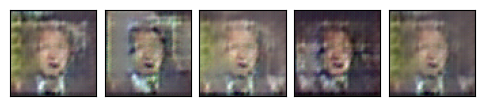

--- EPOCH 48/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 16.56it/s]
Discriminator loss: 0.1201829537193277
Generator loss:     6.104306075110364
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


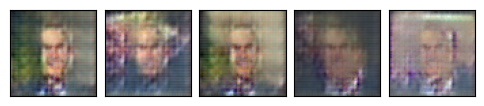

--- EPOCH 49/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 15.91it/s]
Discriminator loss: 0.1976068408520364
Generator loss:     7.68748036783133
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


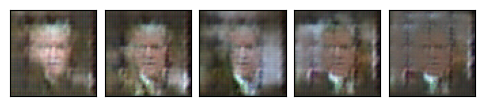

--- EPOCH 50/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 16.53it/s]
Discriminator loss: 0.05375731653019564
Generator loss:     6.884122663469457
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


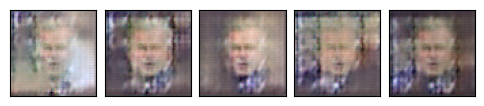

--- EPOCH 51/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 16.17it/s]
Discriminator loss: 0.11916136825040205
Generator loss:     6.977854422668912
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


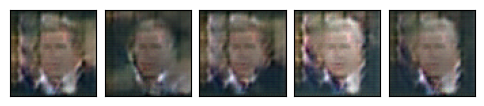

--- EPOCH 52/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 16.55it/s]
Discriminator loss: 0.12405923184063007
Generator loss:     6.350827373675446
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


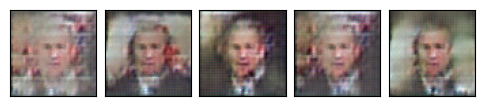

--- EPOCH 53/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 16.35it/s]
Discriminator loss: 0.10777441295447635
Generator loss:     7.264982177250421
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


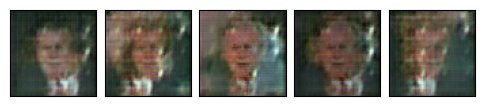

--- EPOCH 54/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 16.59it/s]
Discriminator loss: 0.07970299860879557
Generator loss:     6.5509221340293315
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


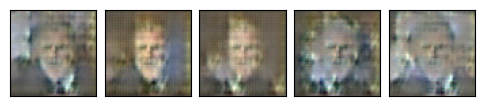

--- EPOCH 55/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 16.74it/s]
Discriminator loss: 0.16620222823833353
Generator loss:     7.009878509080232
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


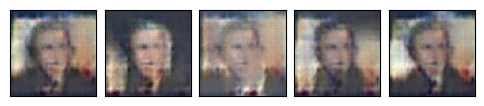

--- EPOCH 56/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 16.67it/s]
Discriminator loss: 0.12180701898994731
Generator loss:     7.275637633764922
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


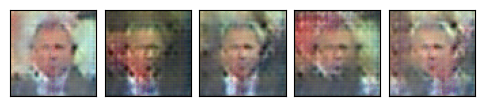

--- EPOCH 57/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 15.94it/s]
Discriminator loss: 0.09158172466750465
Generator loss:     6.678898697468772
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


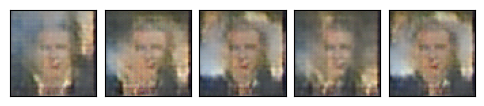

--- EPOCH 58/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 14.78it/s]
Discriminator loss: 0.1986332039223678
Generator loss:     8.628220088446318
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


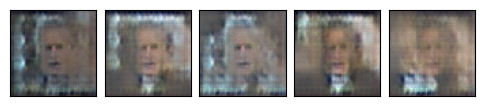

--- EPOCH 59/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 16.51it/s]
Discriminator loss: 0.07797406308019339
Generator loss:     6.870840197178855
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


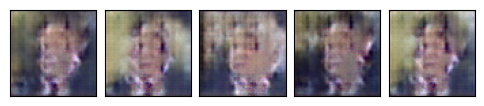

--- EPOCH 60/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 14.76it/s]
Discriminator loss: 0.13546449852301112
Generator loss:     6.910734859865103
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


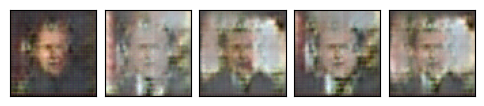

--- EPOCH 61/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 15.86it/s]
Discriminator loss: 0.10970247903866555
Generator loss:     8.67397698359703
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


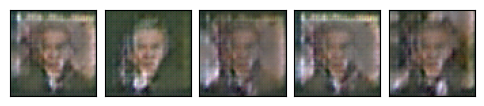

--- EPOCH 62/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 16.63it/s]
Discriminator loss: 0.1354224151973404
Generator loss:     7.160096816162564
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


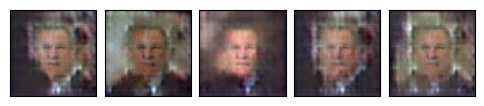

--- EPOCH 63/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 16.16it/s]
Discriminator loss: 0.11214103068767199
Generator loss:     7.234568119049072
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


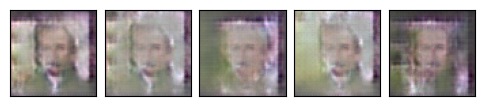

--- EPOCH 64/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 16.68it/s]
Discriminator loss: 0.08469188772141933
Generator loss:     6.949177763355312
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


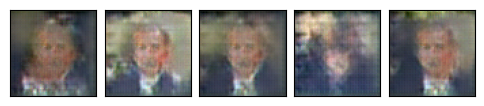

--- EPOCH 65/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 16.70it/s]
Discriminator loss: 0.11265833294992127
Generator loss:     6.776558007766951
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


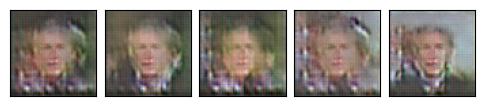

--- EPOCH 66/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 16.68it/s]
Discriminator loss: 0.11637088856590327
Generator loss:     6.776523216446834
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


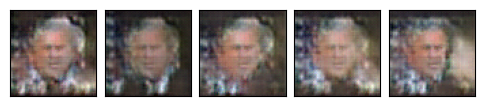

--- EPOCH 67/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 16.34it/s]
Discriminator loss: 0.13998934359692816
Generator loss:     6.417653905811594
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


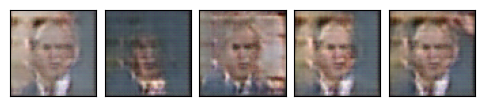

--- EPOCH 68/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 16.59it/s]
Discriminator loss: 0.04467417422070432
Generator loss:     7.917575626230952
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


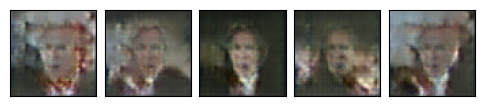

--- EPOCH 69/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 16.64it/s]
Discriminator loss: 0.11465929887855231
Generator loss:     7.820858257919995
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


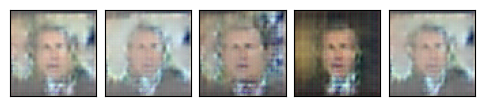

--- EPOCH 70/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 16.51it/s]
Discriminator loss: 0.1279446438177308
Generator loss:     6.626153590074226
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


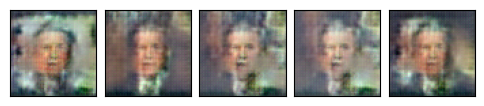

--- EPOCH 71/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 16.60it/s]
Discriminator loss: 0.14791065051373262
Generator loss:     8.243485425835225
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


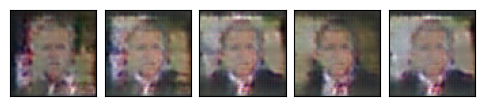

--- EPOCH 72/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 16.74it/s]
Discriminator loss: 0.12799689429464625
Generator loss:     6.983891814502318
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


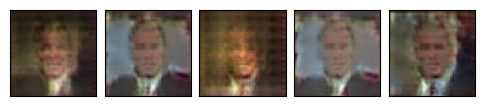

--- EPOCH 73/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 16.69it/s]
Discriminator loss: 0.23058139327079502
Generator loss:     8.464587884162789
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


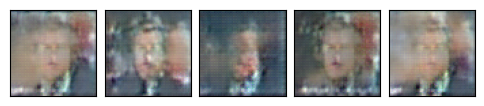

--- EPOCH 74/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 16.59it/s]
Discriminator loss: 0.13159723365818388
Generator loss:     7.030075550079346
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


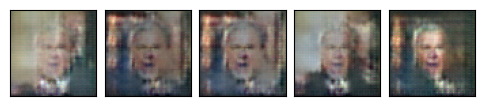

--- EPOCH 75/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 16.67it/s]
Discriminator loss: 0.10055182793580775
Generator loss:     6.5743178004649145
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


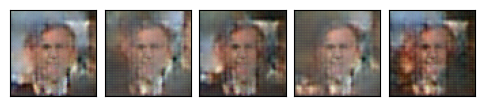

--- EPOCH 76/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 16.21it/s]
Discriminator loss: 0.15616447119904098
Generator loss:     6.4155210167614385
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


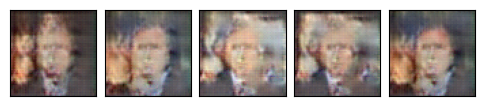

--- EPOCH 77/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 16.68it/s]
Discriminator loss: 0.10618727176047082
Generator loss:     7.128013059274474
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


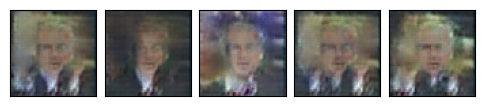

--- EPOCH 78/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 16.67it/s]
Discriminator loss: 0.11587800535915503
Generator loss:     7.412559210364498
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


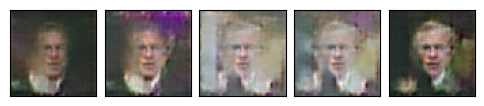

--- EPOCH 79/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 16.74it/s]
Discriminator loss: 0.10348154076222163
Generator loss:     6.566203960731848
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


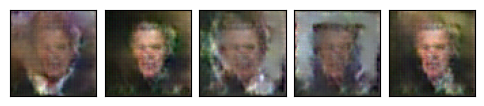

--- EPOCH 80/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 16.66it/s]
Discriminator loss: 0.1362923004511577
Generator loss:     7.599411814960082
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


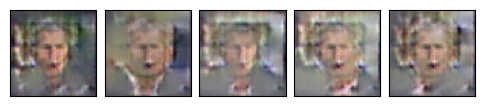

--- EPOCH 81/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 16.60it/s]
Discriminator loss: 0.12555595820964272
Generator loss:     6.68326677493195
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


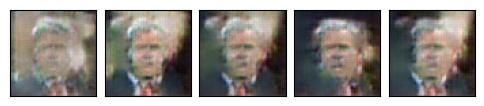

--- EPOCH 82/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 16.66it/s]
Discriminator loss: 0.2907550629617563
Generator loss:     11.643659015200031
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


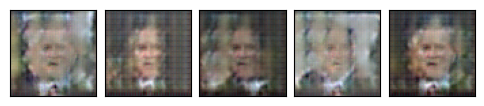

--- EPOCH 83/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 16.64it/s]
Discriminator loss: 0.2255258445363881
Generator loss:     7.601232510894092
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


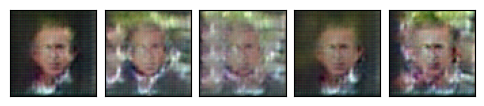

--- EPOCH 84/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 16.44it/s]
Discriminator loss: 0.13536549484663046
Generator loss:     6.8855140778555795
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


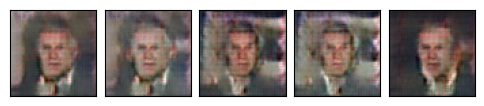

--- EPOCH 85/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 16.41it/s]
Discriminator loss: 0.15641752446987736
Generator loss:     6.4131290450024965
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


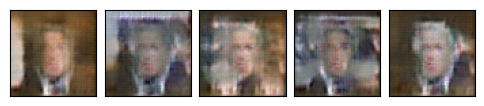

--- EPOCH 86/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 16.29it/s]
Discriminator loss: 0.1497154222773527
Generator loss:     6.8257922272184
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


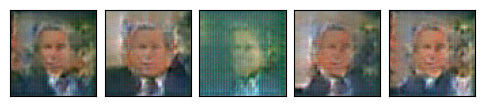

--- EPOCH 87/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 16.63it/s]
Discriminator loss: 0.09165893917653098
Generator loss:     6.802621556751764
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


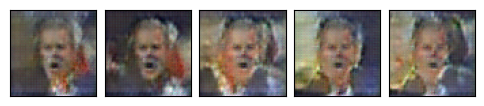

--- EPOCH 88/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 16.36it/s]
Discriminator loss: 0.07699847232494782
Generator loss:     6.753510788305482
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


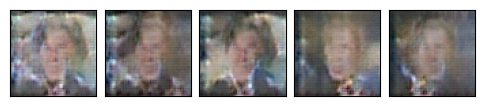

--- EPOCH 89/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 16.59it/s]
Discriminator loss: 0.18087022851652174
Generator loss:     7.100312176035412
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


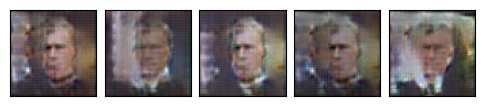

--- EPOCH 90/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 16.65it/s]
Discriminator loss: 0.20427120816129357
Generator loss:     6.945735515053593
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


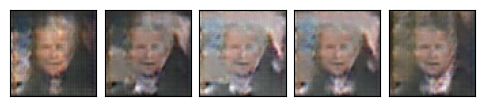

--- EPOCH 91/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 16.66it/s]
Discriminator loss: 0.11827898859532911
Generator loss:     6.6573590413847965
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


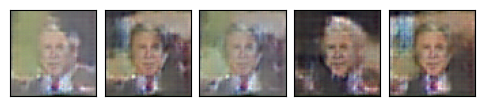

--- EPOCH 92/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 16.63it/s]
Discriminator loss: 0.05987139518803625
Generator loss:     6.904248860344958
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


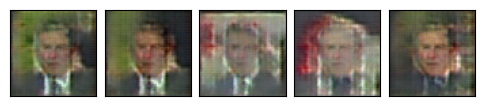

--- EPOCH 93/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 16.69it/s]
Discriminator loss: 0.07971982696830336
Generator loss:     7.1388813559688735
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


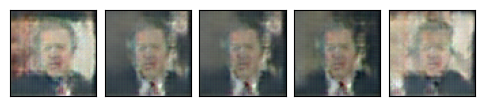

--- EPOCH 94/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 16.35it/s]
Discriminator loss: 0.1535279667421953
Generator loss:     7.776133284639957
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


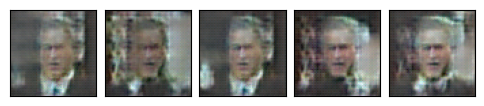

--- EPOCH 95/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 16.68it/s]
Discriminator loss: 0.11355932223707882
Generator loss:     6.556490741558929
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


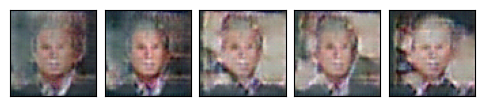

--- EPOCH 96/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 16.67it/s]
Discriminator loss: 0.20043520184595193
Generator loss:     7.855185270309448
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


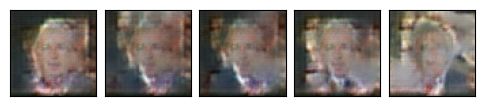

--- EPOCH 97/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 16.62it/s]
Discriminator loss: 0.0794768410720932
Generator loss:     6.440461546627443
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


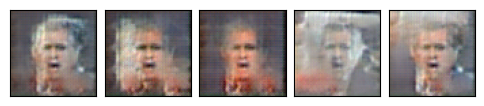

--- EPOCH 98/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 16.67it/s]
Discriminator loss: 0.20005409416756523
Generator loss:     7.800958544460695
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


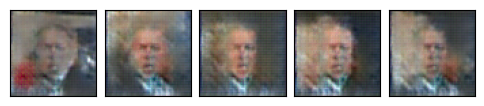

--- EPOCH 99/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 16.63it/s]
Discriminator loss: 0.22617360257279517
Generator loss:     8.298410604249186
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


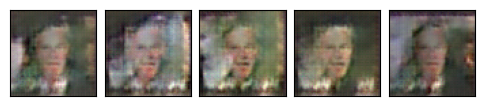

--- EPOCH 100/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 16.54it/s]
Discriminator loss: 0.22837695295908558
Generator loss:     6.987593540504797
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


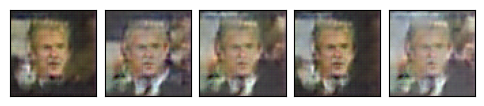

In [67]:
import IPython.display
import tqdm
from hw3.gan import train_batch, save_checkpoint

num_epochs = 100

if os.path.isfile(f'{checkpoint_file_final}.pt'):
    print(f'*** Loading final checkpoint file {checkpoint_file_final} instead of training')
    num_epochs = 0
    gen = torch.load(f'{checkpoint_file_final}.pt', map_location=device)
    checkpoint_file = checkpoint_file_final

try:
    dsc_avg_losses, gen_avg_losses = [], []
    for epoch_idx in range(num_epochs):
        # We'll accumulate batch losses and show an average once per epoch.
        dsc_losses, gen_losses = [], []
        print(f'--- EPOCH {epoch_idx+1}/{num_epochs} ---')

        with tqdm.tqdm(total=len(dl_train.batch_sampler), file=sys.stdout) as pbar:
            for batch_idx, (x_data, _) in enumerate(dl_train):
                x_data = x_data.to(device)
                dsc_loss, gen_loss = train_batch(
                    dsc, gen,
                    dsc_loss_fn, gen_loss_fn,
                    dsc_optimizer, gen_optimizer,
                    x_data)
                dsc_losses.append(dsc_loss)
                gen_losses.append(gen_loss)
                pbar.update()

        dsc_avg_losses.append(np.mean(dsc_losses))
        gen_avg_losses.append(np.mean(gen_losses))
        print(f'Discriminator loss: {dsc_avg_losses[-1]}')
        print(f'Generator loss:     {gen_avg_losses[-1]}')
        
        if save_checkpoint(gen, dsc_avg_losses, gen_avg_losses, checkpoint_file):
            print(f'Saved checkpoint.')
            

        samples = gen.sample(5, with_grad=False)
        fig, _ = plot.tensors_as_images(samples.cpu(), figsize=(6,2))
        IPython.display.display(fig)
        plt.close(fig)
except KeyboardInterrupt as e:
    print('\n *** Training interrupted by user')

*** Images Generated from best model:


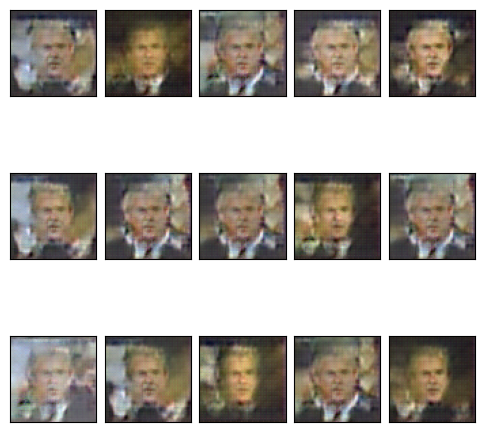

In [69]:
# Plot images from best or last model
if os.path.isfile(f'{checkpoint_file}.pt'):
    gen = torch.load(f'{checkpoint_file}.pt', map_location=device)
print('*** Images Generated from best model:')
samples = gen.sample(n=15, with_grad=False).cpu()
fig, _ = plot.tensors_as_images(samples, nrows=3, figsize=(6,6))

## Questions
<a id=part3_8></a>

**TODO** Answer the following questions. Write your answers in the appropriate variables in the module `hw3/answers.py`.

In [ ]:
from cs236781.answers import display_answer
import hw3.answers

### Question 1

Explain in detail why during training we sometimes need to maintain gradients when sampling from the GAN,
and other times we don't. When are they maintained and why? When are they discarded and why?

In [ ]:
display_answer(hw3.answers.part2_q1)

### Question 2

1. When training a GAN to generate images, should we decide to stop training solely based on the fact that  the Generator loss is below some threshold?
Why or why not?

2. What does it mean if the discriminator loss remains at a constant value while the generator loss decreases?

In [ ]:
display_answer(hw3.answers.part2_q2)

### Question 3

Compare the results you got when generating images with the VAE to the GAN results.
What's the main difference and what's causing it?

In [ ]:
display_answer(hw3.answers.part2_q3)